# **Stock Portfolio Optimization Project**

**Summary:**

The provided code performs a comprehensive analysis of a stock portfolio using Python and various financial libraries.

1. **Data Retrieval and Preparation**:
   - The code retrieves historical stock price data from Yahoo Finance for a selection of stocks (e.g., Infosys, Wipro, Apple, IBM, Amazon) using the `yfinance` library.
   - It selects the adjusted closing prices of these stocks and organizes them into separate dataframes.

2. **Portfolio Construction**:
   - The code calculates normalized returns for each stock, representing their performance relative to their initial prices.
   - It manually assigns an allocation strategy by specifying allocation percentages for each stock.
   - The allocation weights are used to compute position amounts for each stock based on an initial investment amount.

3. **Portfolio Performance Analysis**:
   - The code calculates various performance metrics for the portfolio, including daily returns, average daily return, standard deviation of daily returns, cumulative return, and Sharpe ratio.
   - It visualizes the portfolio's performance over time by plotting its total position value and individual stock positions.

4. **Monte Carlo Simulation**:
   - The code conducts a Monte Carlo simulation to explore a range of possible portfolio compositions.
   - Random weights are generated for each stock in each iteration of the simulation.
   - For each random portfolio, its expected return, volatility, and Sharpe ratio are calculated.
   - Statistical analysis is performed on the results to identify optimal portfolios with desirable risk-return characteristics.

5. **Visualization**:
   - The code visualizes the results of the Monte Carlo simulation using scatter plots, showing the relationship between portfolio volatility, return, and Sharpe ratio.
   - It provides insights into the distribution of portfolio performance metrics and identifies portfolios with the highest Sharpe ratios.

6. **Results & Conclusions**:
   - Based on the analysis, the code generates insights and recommendations for optimizing the portfolio.
   - It offers suggestions for adjusting asset allocations, exploring alternative investment strategies, and monitoring portfolio performance.

The code provides a comprehensive framework for analyzing, optimizing, and visualizing the performance of a stock portfolio using Python and financial modeling techniques. It leverages data analysis, statistical methods, and visualization tools to support informed investment decisions and portfolio management strategies.

In [ ]:
#importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import yfinance as yf
import plotly.graph_objects as go
import statsmodels.api as sm

In [ ]:
#Defining Start to End Dates for Stock Prices
start = pd.to_datetime('2010-01-01')
end = pd.to_datetime('2024-04-01')

In [ ]:
#Choosing the TSocks to Make up the Portfolio using Yahoo Finance API
infy = yf.download('INFY',start,end)
wipro = yf.download('WIPRO.NS',start,end)
iex = yf.download('IEX',start,end)
aapl = yf.download('AAPL',start,end)
ibm = yf.download('IBM',start,end)
amzn = yf.download('AMZN',start,end)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
#Infosys Data Frame
infy

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,7.002500,7.112500,7.001250,7.095000,5.129957,11443200
2010-01-05,7.087500,7.125000,7.048750,7.122500,5.149841,8181600
2010-01-06,7.072500,7.072500,6.970000,7.013750,5.071211,11821600
2010-01-07,6.885000,6.896250,6.777500,6.800000,4.916661,20374400
2010-01-08,6.721250,6.856250,6.693750,6.817500,4.929313,11551200
...,...,...,...,...,...,...
2024-03-22,18.110001,18.120001,17.690001,17.719999,17.719999,15028500
2024-03-25,17.790001,17.790001,17.590000,17.629999,17.629999,12454500
2024-03-26,17.709999,17.820000,17.639999,17.750000,17.750000,10500900


In [ ]:
#Indian Energy Exchange Dataframe
iex

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,31.330000,31.790001,30.860001,31.650000,25.798563,371600
2010-01-05,31.549999,31.549999,31.000000,31.430000,25.619234,373000
2010-01-06,31.440001,31.840000,31.350000,31.809999,25.928988,220300
2010-01-07,31.850000,32.119999,31.559999,31.750000,25.880075,307400
2010-01-08,31.610001,32.279999,31.469999,32.240002,26.279488,229000
...,...,...,...,...,...,...
2024-03-22,246.050003,246.360001,243.050003,243.869995,243.869995,170000
2024-03-25,244.009995,244.089996,241.860001,241.970001,241.970001,227900
2024-03-26,241.740005,243.610001,241.250000,242.089996,242.089996,276300


In [ ]:
#Apple Inc. Dataframe
aapl

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,7.622500,7.660714,7.585000,7.643214,6.470741,493729600
2010-01-05,7.664286,7.699643,7.616071,7.656429,6.481928,601904800
2010-01-06,7.656429,7.686786,7.526786,7.534643,6.378825,552160000
2010-01-07,7.562500,7.571429,7.466071,7.520714,6.367032,477131200
2010-01-08,7.510714,7.571429,7.466429,7.570714,6.409362,447610800
...,...,...,...,...,...,...
2024-03-22,171.759995,173.050003,170.059998,172.279999,172.279999,71106600
2024-03-25,170.570007,171.940002,169.449997,170.850006,170.850006,54288300
2024-03-26,170.000000,171.419998,169.580002,169.710007,169.710007,57388400


In [ ]:
#IBM Dataframe
ibm

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,125.411087,127.122368,125.095604,126.625237,76.767433,6438444
2010-01-05,125.889099,126.051628,124.378586,125.095604,75.840080,7156104
2010-01-06,124.933075,125.707458,124.101341,124.282982,75.347427,5863144
2010-01-07,124.158699,124.521988,123.240921,123.852776,75.086617,6109268
2010-01-08,123.393883,125.162521,123.374763,125.095604,75.840080,4390271
...,...,...,...,...,...,...
2024-03-22,192.000000,192.990005,190.509995,190.839996,190.839996,3987700
2024-03-25,190.259995,190.820007,188.750000,188.789993,188.789993,3718300
2024-03-26,189.020004,190.000000,188.500000,188.500000,188.500000,4229500


In [ ]:
#Amazon Dataframe
amzn

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,6.812500,6.830500,6.657000,6.695000,6.695000,151998000
2010-01-05,6.671500,6.774000,6.590500,6.734500,6.734500,177038000
2010-01-06,6.730000,6.736500,6.582500,6.612500,6.612500,143576000
2010-01-07,6.600500,6.616000,6.440000,6.500000,6.500000,220604000
2010-01-08,6.528000,6.684000,6.451500,6.676000,6.676000,196610000
...,...,...,...,...,...,...
2024-03-22,177.750000,179.259995,176.750000,178.869995,178.869995,27964100
2024-03-25,178.009995,180.990005,177.240005,179.710007,179.710007,29815500
2024-03-26,180.149994,180.449997,177.949997,178.300003,178.300003,29659000


In [ ]:
#Redefing Dataframes to Adjusted Closing Prices
infy = infy[['Adj Close']]
iex = iex[['Adj Close']]
aapl = aapl[['Adj Close']]
ibm = ibm[['Adj Close']]
amzn = amzn[['Adj Close']]

In [ ]:
#Calculating Normalized Returns
for stock_df in (infy, iex, aapl, ibm, amzn):
    stock_df['Normed Return'] = stock_df['Adj Close']/ stock_df.iloc[0]['Adj Close']

<ipython-input-812-0b035334df78>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-812-0b035334df78>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-812-0b035334df78>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-812-0b0

In [ ]:
#Defining Initial Investment of 750,000 USD
Ivest=750000

In [ ]:
#Portfolio Allocation By multiplying Normalized Returns with Allocation weights (13% to Infosys, 26% to Indian Energy Exchange, 18% to Apple, 29% to IBM, 14% to Amazon)
for stock_df, allo in zip((infy, iex, aapl, ibm, amzn),[0.36,0.12,0.11,0.27,0.14]):
    stock_df['Allocation'] = stock_df['Normed Return']*allo

<ipython-input-814-d6af7c580e54>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-814-d6af7c580e54>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-814-d6af7c580e54>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-814-d6a

In [ ]:
#Calculating Position Amount of By Multiplying Allocation Weights Based on Stock with the Initial Investment Amount
for stock_df in (infy, iex, aapl, ibm, amzn):
    stock_df['Position Amount']= stock_df['Allocation']*Ivest

<ipython-input-815-7e2d577b4a7d>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-815-7e2d577b4a7d>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-815-7e2d577b4a7d>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-815-7e2

<Axes: xlabel='Date'>

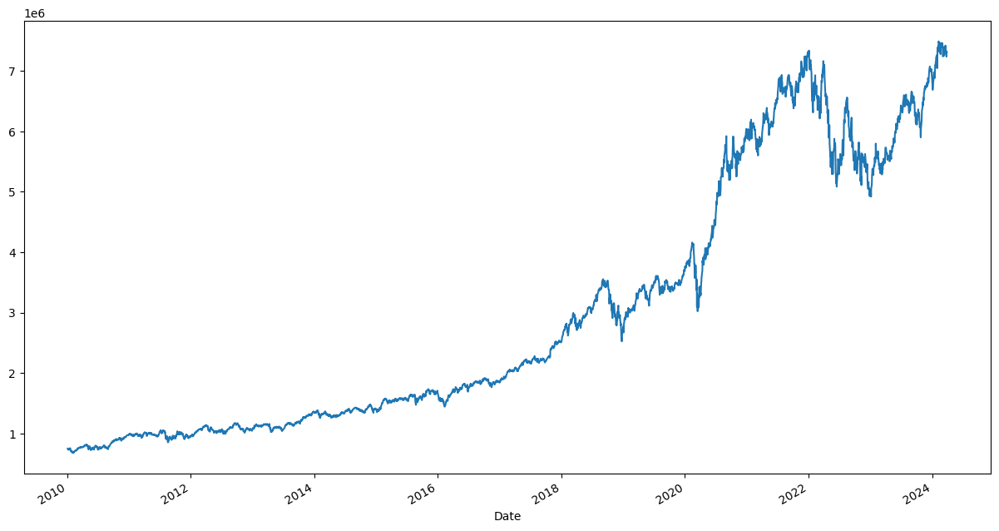

In [ ]:
#New column named 'Total Pos' is created to represent the total portfolio position value, calculated by summing the position amounts across all stocks and is finally Plotted.
total_pos_vals = [infy['Position Amount'], iex['Position Amount'],aapl['Position Amount'], ibm['Position Amount'], amzn['Position Amount']]
portf_vals = pd.concat(total_pos_vals, axis = 1)
portf_vals.columns = ['Infosys Pos','Indian Energy Exhange Pos','Apple Pos', 'IBM Pos', 'Amazon Pos']
portf_vals['Total Pos'] = portf_vals.sum(axis=1)
portf_vals['Total Pos'].plot(figsize = (15,8))

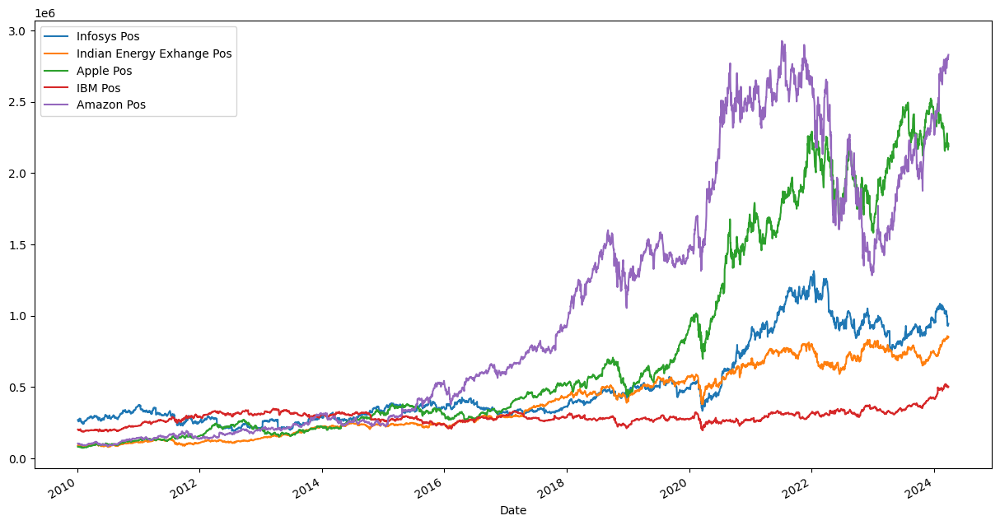

In [ ]:
#Plotting the portfolio position values for each individual stock starting from January 1, 2010, excluding the 'Total Pos' column
portf_vals['2010-01-01':].drop('Total Pos', axis = 1).plot(figsize=(15,8));

In [ ]:
#calculating the daily returns for the total portfolio position value, computing the average daily return, and calculating the standard deviation of daily returns.
portf_vals['Daily Return'] = portf_vals['Total Pos'].pct_change(1)
portf_vals.dropna(inplace = True)
print('Daily Return Average: ',portf_vals['Daily Return'].mean())
print('Daily Return Standard Deviation: ',portf_vals['Daily Return'].std())

Daily Return Average:  0.000724187402799982
Daily Return Standard Deviation:  0.013266480979652613


In [ ]:
#Calculating the cumulative return of the total portfolio based on position values.
cumulative_return = 100*(portf_vals['Total Pos'][-1]/portf_vals['Total Pos'][0]-1)
print('Cumulative return: ', cumulative_return)

Cumulative return:  876.8417273085896


# **Sharpe Ratio Determination of Manually Allocated Portfolio**

The **Sharpe Ratio (SR)** is a measure used to evaluate the risk-adjusted return of an investment or a portfolio. It helps investors understand the return generated per unit of risk taken. The Sharpe Ratio is calculated as the ratio of the average return of the investment (or portfolio) to the standard deviation of its returns.

A higher **Sharpe ratio** is generally preferred, as it indicates a better risk-adjusted return for a portfolio. The Sharpe ratio measures the excess return earned per unit of risk taken, with risk typically represented by the volatility or standard deviation of returns.

A higher Sharpe ratio is desirable because:

1. **Higher Excess Return**: A higher Sharpe ratio implies that the portfolio is generating a higher excess return compared to a risk-free investment for each unit of risk taken. In other words, the portfolio is providing better returns relative to the level of risk assumed.

2. **Better Risk-Adjusted Performance**: A higher Sharpe ratio suggests that the portfolio is achieving superior risk-adjusted performance. Investors typically seek portfolios with higher risk-adjusted returns, as they provide better compensation for the level of risk taken.

3. **Lower Downside Risk**: Portfolios with higher Sharpe ratios tend to have lower downside risk, meaning they experience smaller losses during adverse market conditions. This is because the excess return earned by the portfolio helps cushion the impact of negative market movements.

4. **Indicator of Efficiency**: The Sharpe ratio serves as a measure of efficiency for portfolio managers and investment strategies. A higher Sharpe ratio indicates that the portfolio manager is effectively utilizing risk to generate returns, which is a desirable trait in investment management.

In [ ]:
#Calculating the Sharpe Ratio for the Portfolio
SR = portf_vals['Daily Return'].mean()/portf_vals['Daily Return'].std()
print('Sharpe Ratio = ', SR)

Sharpe Ratio =  0.0545877541987736


In [ ]:
#Annual Sharpe Ratio of the Portfolio
ASR = (252**0.5) * SR
print('Annualized Sharpe Ratio = ', ASR)

Annualized Sharpe Ratio =  0.8665537334368612


In [ ]:
#Creating a Single dataframe of all the Stocks Adjusted Closing Prices
stocks = pd.concat([infy['Adj Close'],iex['Adj Close'],aapl['Adj Close'], ibm['Adj Close'], amzn['Adj Close']], axis = 1)
stocks.columns = ['Infosys','Indian Energy Exchange','Apple', 'IBM', 'Amazon']
stocks.head()

,Infosys,Indian Energy Exchange,Apple,IBM,Amazon
Date,,,,,
2010-01-04,5.129957,25.798563,6.470741,76.767433,6.6950
2010-01-05,5.149841,25.619234,6.481928,75.840080,6.7345
2010-01-06,5.071211,25.928988,6.378825,75.347427,6.6125
2010-01-07,4.916661,25.880075,6.367032,75.086617,6.5000
2010-01-08,4.929313,26.279488,6.409362,75.840080,6.6760


In [ ]:
#Calculating the mean (average) daily returns for each column in the DataFrame
stocks.pct_change(1).mean()

Infosys                   0.000519
Indian Energy Exchange    0.000738
Apple                     0.001072
IBM                       0.000353
Amazon                    0.001134
dtype: float64

In [ ]:
#Calculates the correlation matrix of the daily returns of the stocks in the DataFrame
stocks.pct_change(1).corr()

,Infosys,Indian Energy Exchange,Apple,IBM,Amazon
Infosys,1.000000,0.417246,0.369142,0.404913,0.305516
Indian Energy Exchange,0.417246,1.000000,0.445859,0.513685,0.377468
Apple,0.369142,0.445859,1.000000,0.401072,0.483522
IBM,0.404913,0.513685,0.401072,1.000000,0.311903
Amazon,0.305516,0.377468,0.483522,0.311903,1.000000


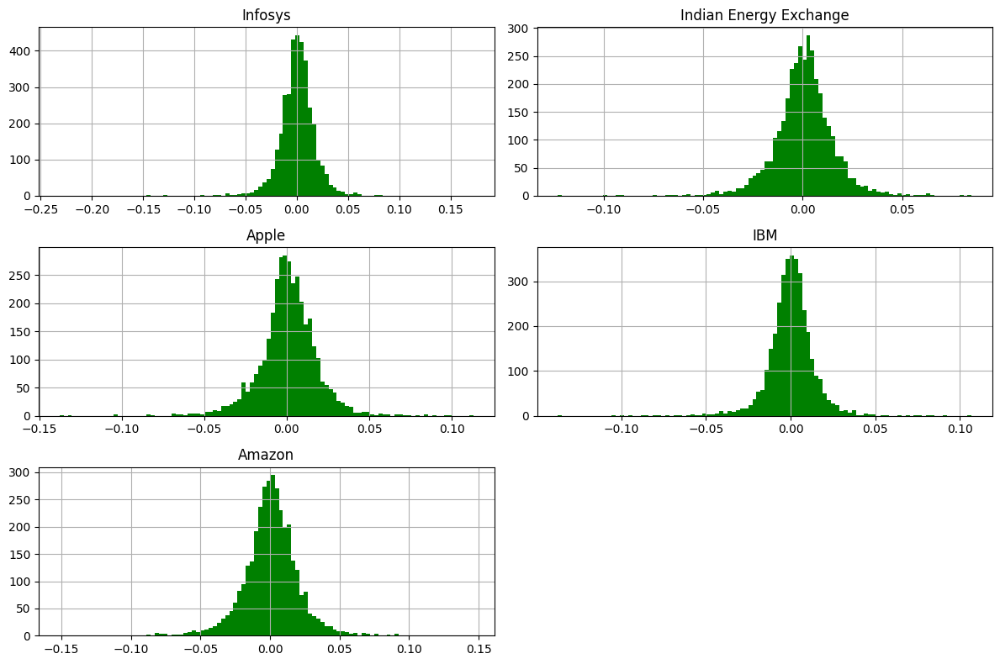

In [ ]:
#Calculating the logarithmic returns of the stocks' prices and then creating a histogram of these returns
log_returns = np.log(stocks/stocks.shift(1))
log_returns.hist(bins = 100, figsize = (12,8), color = 'g')
plt.tight_layout()

**Why do we Use Logarithmic Returns for further analysis & calculations?**

Logarithmic returns are commonly used for further analysis and calculations in our project for several reasons:

1. **Additivity**: Logarithmic returns have the property of additivity. When you take the logarithm of the ratio of two prices, the resulting log return of a portfolio is simply the sum of the log returns of its individual assets. This property simplifies calculations involving returns of multiple assets, such as portfolio returns or the aggregation of returns over time.

2. **Symmetry**: Logarithmic returns are symmetric, meaning that positive and negative returns are treated symmetrically. This is important for statistical analysis and modeling, as it ensures that the distribution of returns is symmetric around zero, which simplifies interpretation and analysis.

3. **Interpretation**: Logarithmic returns can be interpreted as continuously compounded returns. This interpretation is particularly useful in the context of investment performance analysis and portfolio optimization, as it provides a consistent and intuitive measure of returns that is independent of the length of the holding period.

4. **Normality**: Under certain assumptions, log returns tend to follow a normal distribution more closely than simple returns. This makes them useful for statistical analysis and modeling techniques that rely on assumptions of normality, such as risk management, option pricing, and asset allocation.

5. **Mathematical Convenience**: Logarithmic returns offer mathematical convenience in various calculations, such as calculating the geometric mean, estimating volatility, or performing linear regression analysis. Their properties make them well-suited for many quantitative finance applications.

The use of logarithmic returns in finance provides several advantages, including mathematical simplicity, symmetry, and compatibility with statistical techniques. These properties make logarithmic returns a preferred choice for analyzing and modeling financial data in various contexts, including portfolio management, risk assessment, and investment strategy evaluation.


# **Monte Carlo Simulation**

Monte Carlo simulation is a powerful tool for risk analysis and decision-making in finance, as it allows for the examination of a wide range of possible outcomes and their associated probabilities.

It is particularly useful in portfolio optimization, where it can help investors understand the potential performance of different investment strategies under various market conditions.

In [ ]:
#Generating Random Weights this forms an explanative Basis of the Monte Carlo Simulation
np.random.seed(101)
print(stocks.columns)

weights = np.array(np.random.random(5))

print('\n')
print('Random Weights: ')
print(weights)
print('\n')

#However, the sum of the weights must be equal to 100 hence we rebalance them to total upto a 100
print('Rebalance')
weights = weights/np.sum(weights)
print(weights)

Index(['Infosys', 'Indian Energy Exchange', 'Apple', 'IBM', 'Amazon'], dtype='object')


Random Weights: 
[0.51639863 0.57066759 0.02847423 0.17152166 0.68527698]


Rebalance
[0.26182041 0.28933544 0.01443678 0.08696357 0.3474438 ]


In [ ]:
#Defining the number of trading days in a year
Num_of_Tdays=252

In [ ]:
#Displaying Expected Portfolio return based on random weight allocation
exp_ret = np.sum((log_returns.mean() * weights) * Num_of_Tdays)
print('Expected Portfolio Return: ',exp_ret)

Expected Portfolio Return:  0.15819935377012945


In [ ]:
#Calculating Expected Volatility of the Portfolio
exp_vol = np.sqrt(np.dot(weights.T,np.dot(log_returns.cov() * Num_of_Tdays, weights)))
print('Expected Volatility: ', exp_vol)

Expected Volatility:  0.21133576376157706


In [ ]:
#Calculating the Sharpe ratio of the portfolio with Random weights
SR = exp_ret/exp_vol
print('Sharpe Ratio: ', SR)

Sharpe Ratio:  0.748568774893233


In [ ]:
#Monte Carlo Simulation Method for N Portolios
num_ports = 100000
all_weights = np.zeros((num_ports,len(stocks.columns)))
ret_arr = np.zeros(num_ports)
vol_arr = np.zeros(num_ports)
sharpe_arr = np.zeros(num_ports)

for ind in range(num_ports):
    weights = np.array(np.random.random(5))
    weights = weights / np.sum(weights)
    all_weights[ind,:] = weights
    ret_arr[ind] = np.sum((log_returns.mean() * weights) *Num_of_Tdays)
    vol_arr[ind] = np.sqrt(np.dot(weights.T, np.dot(log_returns.cov() * Num_of_Tdays, weights)))
    sharpe_arr[ind] = ret_arr[ind]/vol_arr[ind]

In [ ]:
#Finding out the Maximum Sharpe Ratio in the Simulation
sharpe_arr.max()

0.9300527665946254

In [ ]:
#Finding out the Portfolio Position of the Max Sharpe Ratio in the Simulation
sharpe_arr.argmax()

99584

In [ ]:
#Displaying the weights of how the stocks are allocated in the best Portfolio having the Maximum Sharpe Ratio
all_weights[sharpe_arr.argmax(),:]

array([0.00195741, 0.31010991, 0.40352876, 0.00189343, 0.28251049])

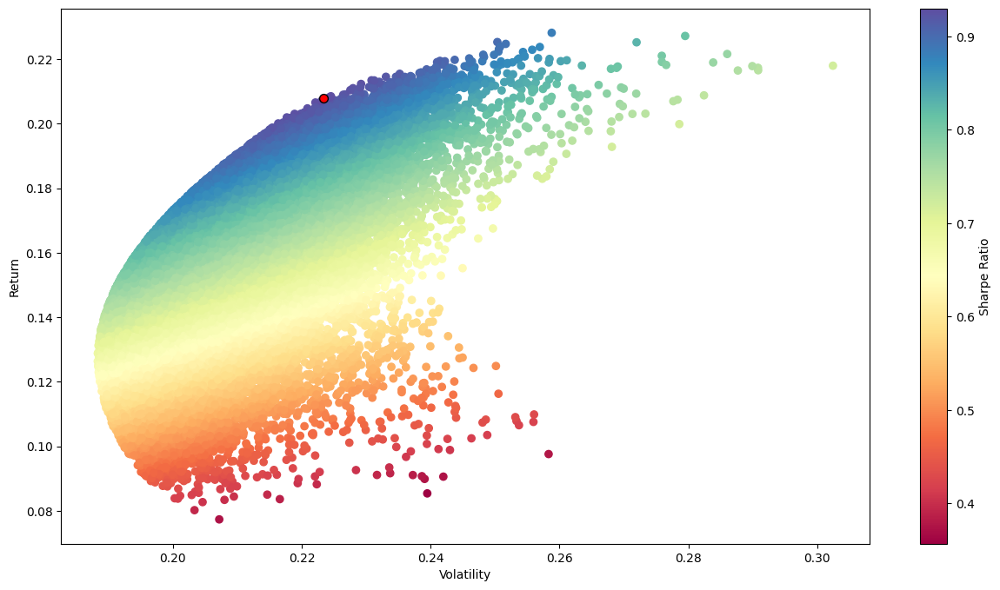

In [ ]:
#Scatter plot to visualize the relationship between portfolio volatility, portfolio return, and Sharpe ratio for the randomly generated portfolios.
plt.figure(figsize = (15,8))
plt.scatter(vol_arr,ret_arr,c=sharpe_arr,cmap='Spectral')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility')
plt.ylabel('Return')

# Add red dot for max Sharpe Ratio
max_sr_ret = ret_arr[sharpe_arr.argmax()]
max_sr_vol = vol_arr[sharpe_arr.argmax()]
plt.scatter(max_sr_vol,max_sr_ret,c='red',s=50,edgecolors='black');

In [ ]:
# Create a trace for the scatter plot
scatter_trace = go.Scatter(
    x=vol_arr,
    y=ret_arr,
    mode='markers',
    marker=dict(
        size=8,
        color=sharpe_arr,
        colorscale='Spectral',
        colorbar=dict(title='Sharpe Ratio'),
        opacity=0.8,
    ),
    hoverinfo='text',
    text=['Volatility: {:.2f}<br>Return: {:.2f}<br>Sharpe Ratio: {:.2f}'.format(vol, ret, sr)
          for vol, ret, sr in zip(vol_arr, ret_arr, sharpe_arr)],
)

# Create a red dot for the maximum Sharpe ratio point
max_sr_ret = ret_arr[sharpe_arr.argmax()]
max_sr_vol = vol_arr[sharpe_arr.argmax()]
max_sr_trace = go.Scatter(
    x=[max_sr_vol],
    y=[max_sr_ret],
    mode='markers',
    marker=dict(color='red', size=8),
    showlegend=False
)

# Create the layout for the plot
layout = go.Layout(
    title='Portfolio Optimization',
    xaxis=dict(title='Volatility'),
    yaxis=dict(title='Return'),
)

# Create the figure and add the traces
fig = go.Figure(data=[scatter_trace, max_sr_trace], layout=layout)

# Show the plot
fig.show()


This scatter plot visualizes the relationship between volatility **(x-axis)** and return **(y-axis)** across a large dataset, likely representing different financial assets or investments. From the plotted points and their color gradient, we can derive several insights:

**Overall trend:** There appears to be a positive correlation between volatility and return, as indicated by the concentration of points forming an upward-sloping pattern from the bottom-left to the top-right of the plot.

**Risk-return tradeoff:** Higher volatility **(risk)** is generally associated with higher potential returns, while lower volatility corresponds to lower returns. This aligns with the fundamental principle of risk-return tradeoff in finance.
Range of outcomes: For any given level of volatility, there is a range of potential returns, both positive and negative, as evidenced by the vertical spread of points at different volatility levels.

**Concentration of points:** The density of points is higher in the lower-left region, suggesting that there are more assets or investments with lower volatility and lower returns in the dataset.

**Outliers:** There are some outlier points with relatively high volatility but low returns **(bottom-right)** or low volatility but high returns **(top-left)**, deviating from the overall trend.

**Risk-return profile:** The color gradient indicates that assets or investments with lower volatility **(blue)** tend to have lower returns, while those with higher volatility **(red)** generally offer higher potential returns.

These insights can be valuable for investors or portfolio managers in understanding the risk-return characteristics of different assets, identifying potential investment opportunities, and making informed decisions based on their risk tolerance and return expectations.

# **Results & Conclusions**

By employing a stochastic method like Monte Carlo simulation we have a better performing portfolo having a Sharpe Ratio of **0.930** as compared to our initial portfolio having a Sharpe Ratio of **0.866** boasting an increase of **6.4%**, The Project systematically explores a wide range of possible portfolio compositions, evaluates their performance under different scenarios, and identifies optimal portfolios that offer the best risk-adjusted returns. This approach enhances the decision-making process and enables investors to build more robust and efficient investment portfolios.

This Project Helps in the further processes such as:

1. **Portfolio Performance**: Provide an overview of the portfolio's performance, including its average daily return, standard deviation of daily returns, cumulative return over the analyzed period, and Sharpe ratio.

2. **Comparison with Benchmarks**: Compare the portfolio's performance metrics with relevant benchmarks, such as market indices or industry averages. Highlight how the portfolio's risk-adjusted return compares to the benchmark, as indicated by the Sharpe ratio.

3. **Risk Management**: Discuss the effectiveness of the portfolio's risk management strategies based on its volatility and downside risk. Evaluate whether the portfolio's risk-adjusted return justifies the level of risk taken.

4. **Optimization Opportunities**: Identify potential optimization opportunities based on the analysis. This could include adjusting the portfolio's asset allocation, exploring alternative investment strategies, or implementing risk mitigation techniques to enhance risk-adjusted returns.

5. **Investment Strategy**: Provide insights into the investment strategy employed and its alignment with the investor's objectives and risk tolerance. Discuss how the portfolio's composition and performance reflect the investor's investment philosophy and approach.

6. **Future Outlook**: Offer a forward-looking perspective on the portfolio's potential performance. Discuss potential market trends, economic factors, or other variables that could impact the portfolio's returns and risk profile in the future.

7. **Recommendations**: Based on the analysis, provide recommendations for portfolio adjustments or strategic decisions. This could include rebalancing the portfolio, diversifying investments, or considering alternative asset classes to optimize risk-adjusted returns.

8. **Monitoring and Review**: Emphasize the importance of ongoing monitoring and review of the portfolio's performance. Suggest establishing regular review intervals to assess performance, reassess objectives, and make necessary adjustments to the investment strategy.

**Drawbacks of Monte Carlo Simulation**


1. **Computational Intensity**: Monte Carlo simulations can be computationally intensive, especially when a large number of random portfolios are generated. In your code, you are generating 20,000 random portfolios (`num_ports = 20000`), which can require significant computational resources and time to execute, especially for complex optimization problems.

2. **Dependence on Randomness**: Monte Carlo simulations rely on randomness to generate portfolios, which can lead to variability in results. While generating a large number of random portfolios can help mitigate this variability to some extent, the quality and robustness of the results still depend on the randomness of the generated portfolios. Additionally, the quality of the results may vary depending on the distribution of random numbers used.

3. **Limited Insight into Real-world Dynamics**: Monte Carlo simulations are based on historical data and assumptions about asset returns and volatilities. While they can provide insights into potential portfolio performance under different market conditions, they may not fully capture the complex and dynamic nature of financial markets. Factors such as sudden market shocks, changes in investor sentiment, and unexpected events are difficult to model accurately in a Monte Carlo simulation.

It's essential to consider the trade-off between the number of random portfolios generated and the computational resources required. While increasing the number of random portfolios may lead to a better estimation of portfolio performance metrics such as the Sharpe ratio, it also increases computational complexity and runtime. Therefore, it's crucial to strike a balance between accuracy and computational efficiency when using Monte Carlo simulations for portfolio optimization.